# Machine Learning Exploration
This Notebook demonstrates how the Hypothesis class of a learning algorithm can impact function approximation of an image. 

Get to know the functionality by playing with the parameters and algorithms.

This notebook is adapted from the excellent work by Alex Rogozhnikov, presented in this [notebook](https://github.com/arogozhnikov/arogozhnikov.github.io/blob/master/notebooks/2016-02-09-DrawingPictureWithML.ipynb).

## Imports

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

%load_ext line_profiler

# Ignore Warnings
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

from helper_functions import tic, toc

""" Include Parent Directory in Python Path """
import os,sys,inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir) 

In [20]:
# !pip install image
from PIL import Image
%pylab inline

import numpy
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor, AdaBoostRegressor

from sklearn.cross_validation import train_test_split
from sklearn.random_projection import GaussianRandomProjection
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

from rep.metaml import FoldingRegressor
from rep.estimators import XGBoostRegressor#, TheanetsRegressor

Populating the interactive namespace from numpy and matplotlib


## Download the picture

I took quite complex picture with many little details

In [41]:
!wget http://orig05.deviantart.net/1d93/f/2009/084/5/2/new_york_black_and_white_by_morgadu.jpg -O image.jpg

--2016-12-20 09:29:44--  http://orig05.deviantart.net/1d93/f/2009/084/5/2/new_york_black_and_white_by_morgadu.jpg
Resolving orig05.deviantart.net (orig05.deviantart.net)... 54.240.184.213, 54.240.184.137, 54.240.184.21, ...
Connecting to orig05.deviantart.net (orig05.deviantart.net)|54.240.184.213|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 657820 (642K) [image/jpeg]
Saving to: ‘image.jpg’

image.jpg           100%[===================>] 642,40K   676KB/s    in 1,0s    

2016-12-20 09:29:45 (676 KB/s) - ‘image.jpg’ saved [657820/657820]



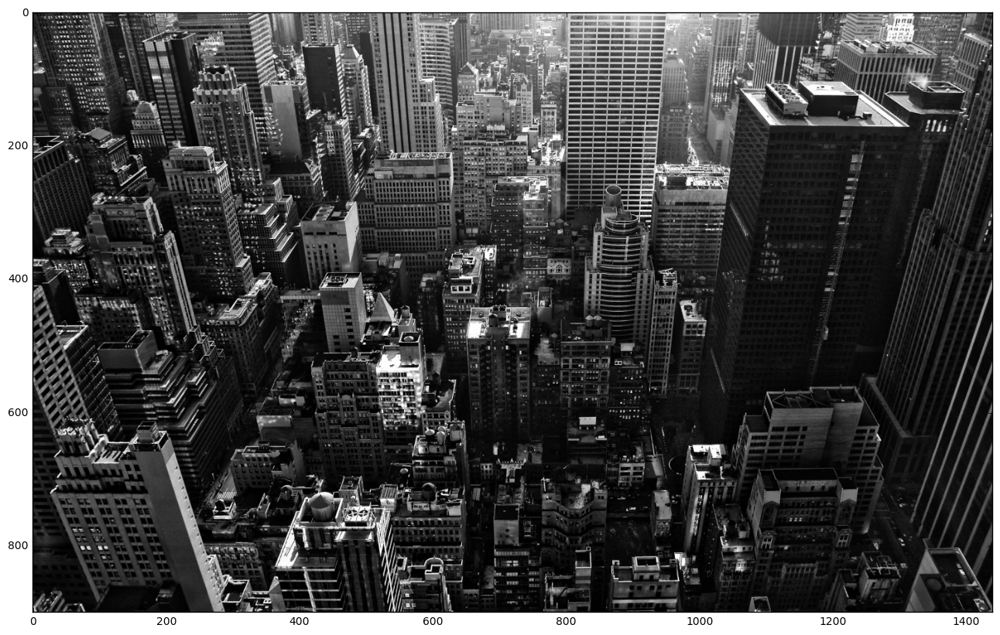

In [42]:
image = numpy.asarray(Image.open('./image.jpg')).mean(axis=2)

plt.figure(figsize=[20, 10])
plt.imshow(image, cmap='gray');

## Define a function to train regressor

`train_size` is how many pixels shall be used in reconstructing the picture. By default, the algorithm will use only 2% of pixels

In [43]:
def train_display(regressor, image, train_size=0.02):
    height, width = image.shape
    flat_image = image.reshape(-1)
    xs = numpy.arange(len(flat_image)) % width
    ys = numpy.arange(len(flat_image)) // width    
    data = numpy.array([xs, ys]).T
    target = flat_image
    trainX, testX, trainY, testY = train_test_split(data, target, train_size=train_size, random_state=42)
    mean = trainY.mean()
    regressor.fit(trainX, trainY - mean)
    new_flat_picture = regressor.predict(data) + mean
    plt.figure(figsize=[20, 10])
    plt.subplot(121)
    plt.imshow(image, cmap='gray')
    plt.subplot(122)
    plt.imshow(new_flat_picture.reshape(height, width), cmap='gray')

## Linear regression
not very surprising result

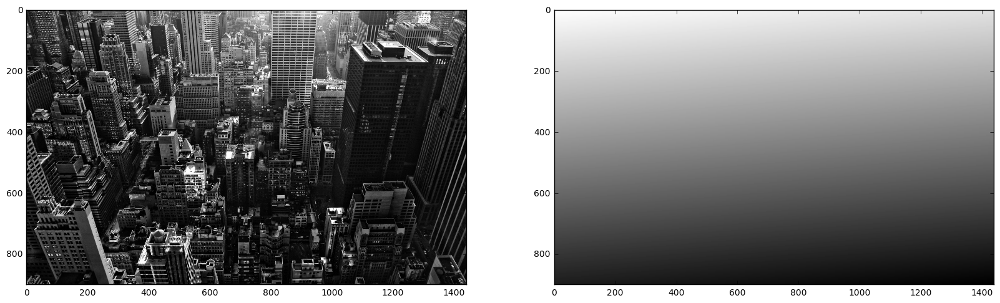

In [44]:
train_display(LinearRegression(), image)

## Decision tree limited by depth

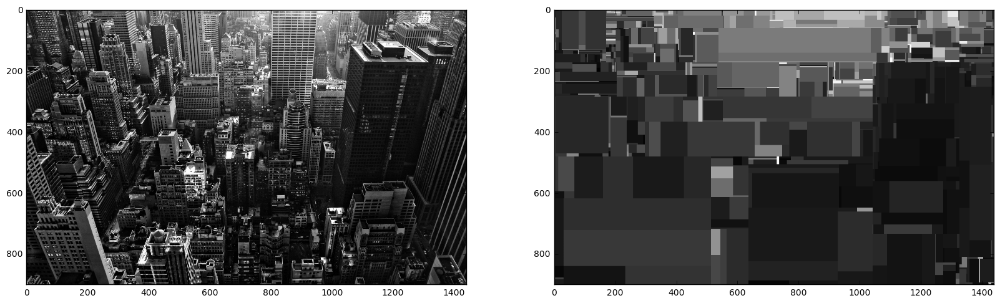

In [45]:
train_display(DecisionTreeRegressor(max_depth=10), image)

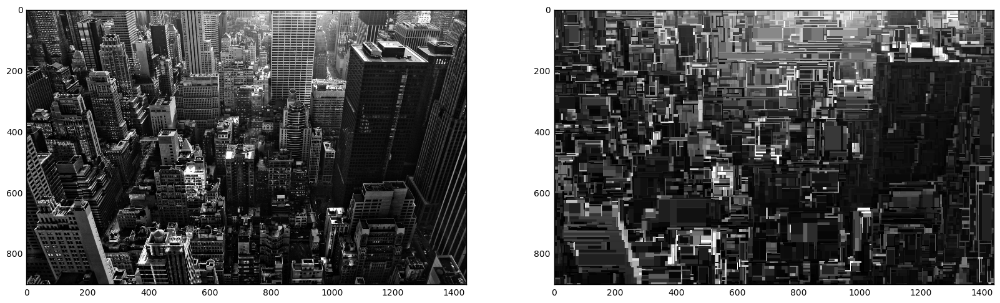

In [46]:
train_display(DecisionTreeRegressor(max_depth=20), image)

## Decision tree limited by minimal number of samples in a leaf

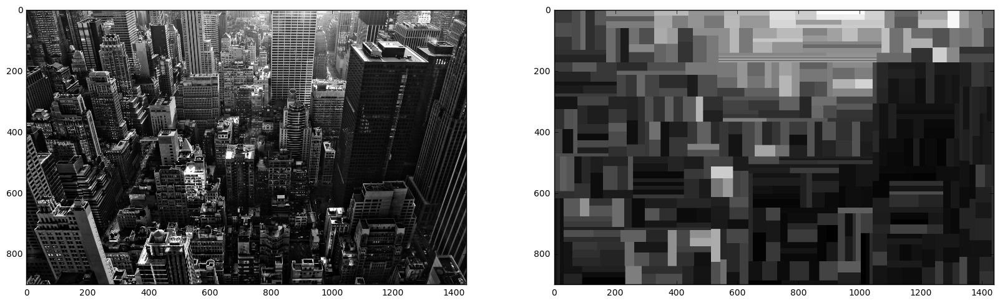

In [47]:
train_display(DecisionTreeRegressor(min_samples_leaf=40), image)

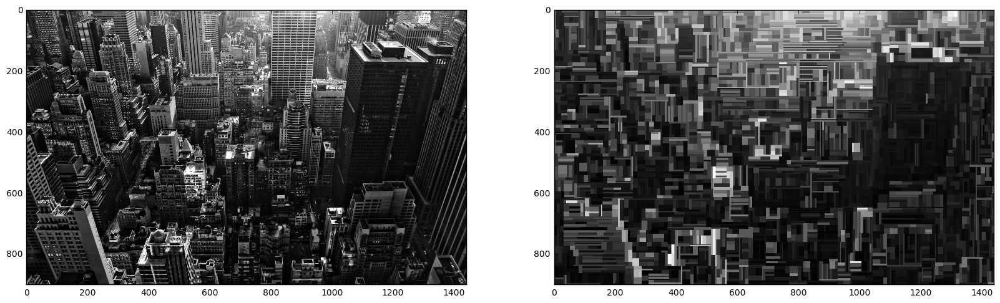

In [48]:
train_display(DecisionTreeRegressor(min_samples_leaf=5), image)

## RandomForest

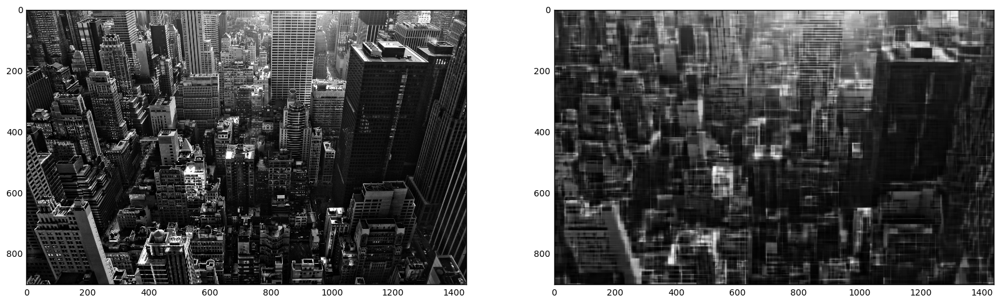

In [49]:
train_display(RandomForestRegressor(n_estimators=100), image)

## K Nearest Neighbours

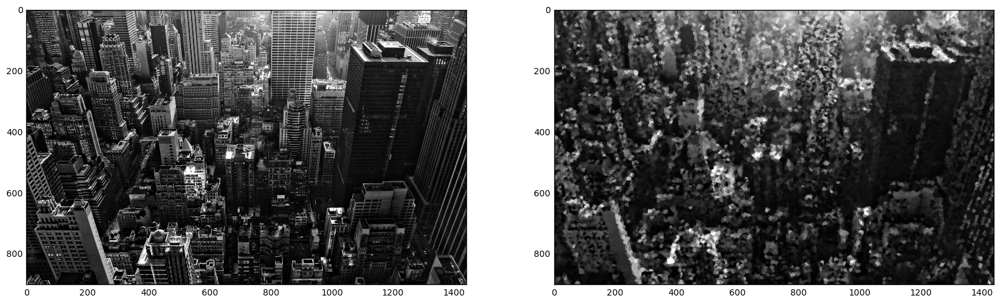

In [50]:
train_display(KNeighborsRegressor(n_neighbors=2), image)

### more neighbours + weighting according to distance
to make predictions smoother

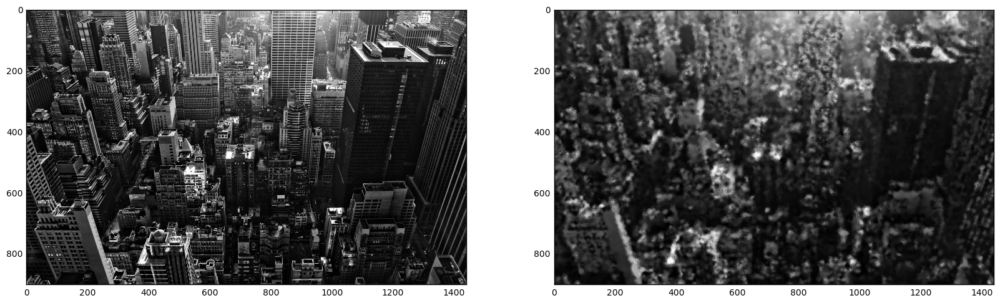

In [51]:
train_display(KNeighborsRegressor(n_neighbors=5, weights='distance'), image)

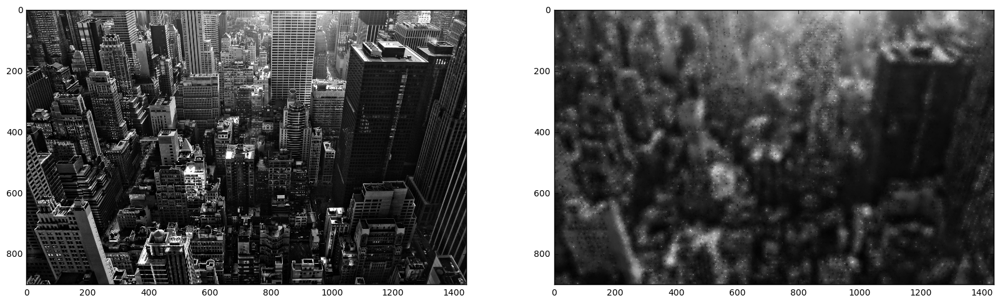

In [52]:
train_display(KNeighborsRegressor(n_neighbors=25, weights='distance'), image)

## KNN with canberra metric

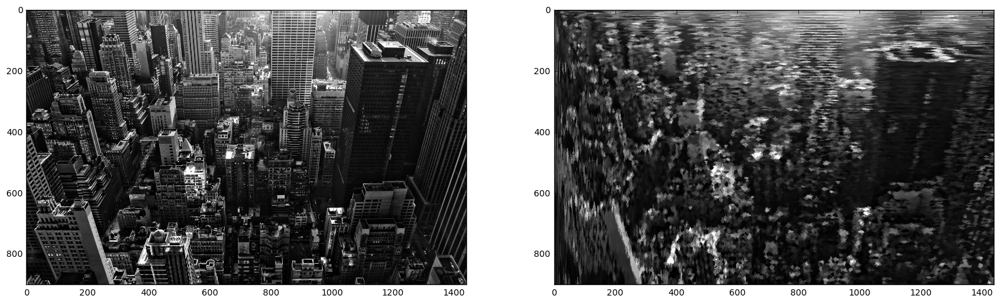

In [53]:
train_display(KNeighborsRegressor(n_neighbors=2, metric='canberra'), image)

## Gradient Boosting

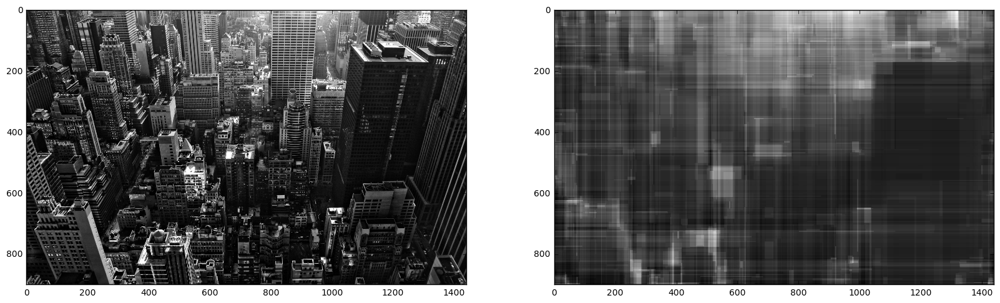

In [54]:
train_display(XGBoostRegressor(max_depth=5, n_estimators=100, subsample=0.5, nthreads=4), image)

## Gradient Boosting with deep trees

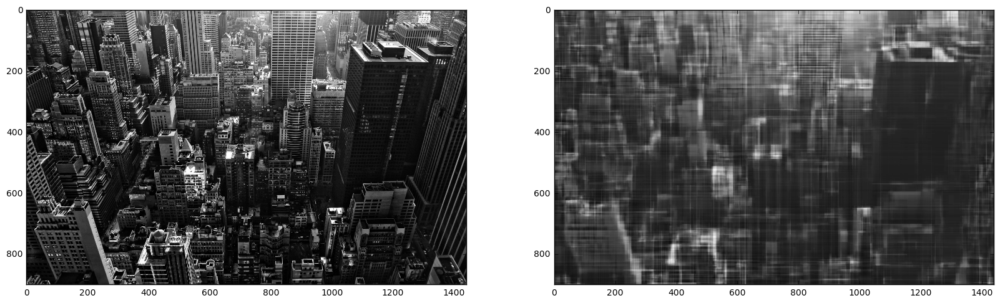

In [55]:
train_display(XGBoostRegressor(max_depth=12, n_estimators=100, subsample=0.5, nthreads=4, eta=0.1), image)

## AdaBoost over Decision Trees using random projections

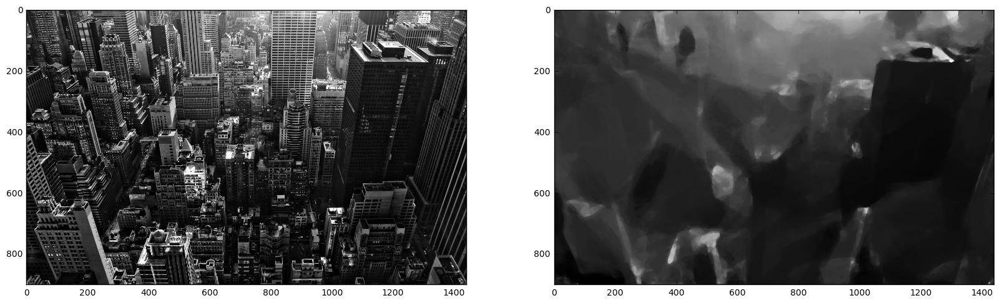

In [56]:
base = make_pipeline(GaussianRandomProjection(n_components=10), 
                     DecisionTreeRegressor(max_depth=10, max_features=5))
train_display(AdaBoostRegressor(base, n_estimators=50, learning_rate=0.05), image)

## Bagging over decision trees using random projections

This is sometimes referred as Random Forest too (since this idea was proposed by Leo Breiman in the same paper).

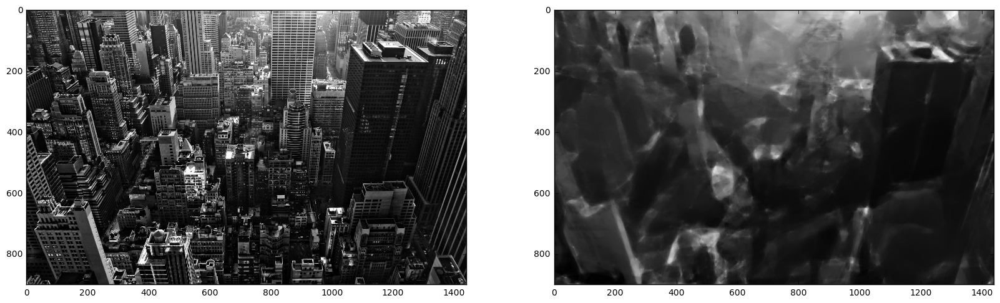

In [57]:
base = make_pipeline(GaussianRandomProjection(n_components=15), 
                     DecisionTreeRegressor(max_depth=12, max_features=5))
train_display(BaggingRegressor(base, n_estimators=100), image)